In [1]:
# Magic Words
from __future__ import annotations
from typing import Union, Optional, TypedDict, Any

import matplotlib as mpl
import matplotlib.pyplot as plt  # noqa: F401
import seaborn as sns
import numpy as np  # noqa: F401
import pandas as pd
from collections import defaultdict, Counter  # noqa: F401
from IPython.display import display, Markdown

%matplotlib inline
%load_ext wurlitzer
# mpl.rcParams["font.family"] = "Noto Sans JP"
# sns.set(font=["Noto Sans JP"], font_scale=1.5)
pd.set_option("display.date_yearfirst", True)
pd.set_option("display.float_format", "{:.4f}".format)


# The function displays Table or Text even inside function
def show_it(
    data: Union[str, pd.DataFrame],
    demical: Optional[int] = 4,
) -> None:
    if isinstance(data, pd.DataFrame):
        display(
            Markdown(data.to_markdown(floatfmt=f".{demical}f", intfmt=","))
        )
    else:
        display(Markdown(data.strip()))
    return

# 共通データ・共通設定

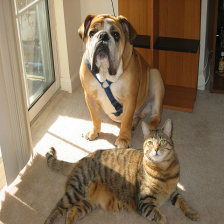

In [2]:
import os
import subprocess

from PIL import Image, ImageFilter


# The famous image of both dog and cat often used in CAM papers
url: str = (
    "https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/"
    "master/examples/both.png"
)
path: str = "both.png"
if not os.path.exists(path):
    subprocess.run(["wget", "-q", "-O", path, url])
Image.open(path)

In [3]:
# common parameters
n_channels: int = 16
random_state: int = 12

In [4]:
# backbone CNN model
cnn_model: str = "MobileNetV3Large"
# cnn_model: str = "VGG16"
# cnn_model: str = "ResNet50"

In [5]:
# n_groups
n_groups_group: int
n_groups_cosine: int
if cnn_model == "MobileNetV3Large":
    n_groups_group = 14
    n_groups_cosine = 5
elif cnn_model == "VGG16":
    n_groups_group = 8
    n_groups_cosine = 8
elif cnn_model == "ResNet50":
    n_groups_group = 14
    n_groups_cosine = 5

In [6]:
# init option
class InitOption(TypedDict):
    path: str
    cnn_model: str
    n_channels: int
    random_state: int


init_option: InitOption = InitOption(
    path=path,
    cnn_model=cnn_model,
    n_channels=n_channels,
    random_state=random_state,
)

In [7]:
# common labels
label_dog: int = 243
label_cat: int = 282

In [8]:
# common target
target_last: str = "last"
target_all: str = "all"

In [9]:
# heatmap type
draw_negative: bool = True

In [10]:
# size of figuer and font
figsize: float = 2.24  # 224 pixel -> 100 dpi * 2.24 inch
fontsize: float = 10.0

In [11]:
# draw option
class DrawOption(TypedDict):
    path: str
    draw_negative: bool
    figsize: float
    rc: Dict[str, Any]


rc: Dict[str, Any] = {
    # "font.family": "sans-serif",
    "font.family": "Noto Sans JP",
    "font.size": fontsize,
    "figure.titlesize": fontsize * 1.4,
    "xtick.labelsize": fontsize * 0.6,
    "ytick.labelsize": fontsize * 0.6,
    "axes.linewidth": 0.2,
    "xtick.major.size": 2.0,
    "xtick.major.width": 0.2,
    "ytick.major.size": 2.0,
    "ytick.major.width": 0.2,
}
draw_option: DrawOption = DrawOption(
    path=path,
    draw_negative=draw_negative,
    figsize=figsize,
    rc=rc,
)

## heatmap を描く便利関数

In [12]:
from matplotlib.image import AxesImage

from cam import CAM
from cam.base import TargetLayer


def draw_two_heatmaps(
    model: CAM,
    target: TargetLayer,
    left: int,
    right: int,
    option: DrawOption,
) -> None:
    """CAMモデルのheatmapをふたつ書く関数"""
    figsize: float = draw_option["figsize"]
    rc: Dict[str, Any] = draw_option["rc"]
    with plt.rc_context(rc=rc):
        fig, axes = plt.subplots(
            ncols=2, nrows=1, figsize=(figsize * 2, figsize)
        )
        colorbar: AxesImage = model.draw(
            target=target,
            label=left,
            ax=axes[0],
            title_label=True,
            title_score=True,
            **option,
        )
        fig.colorbar(colorbar, ax=axes[0], shrink=0.8)
        colorbar = model.draw(
            target=target,
            label=right,
            fig=fig,
            ax=axes[1],
            draw_colorbar=True,
            title_label=True,
            title_score=True,
            **option,
        )
        fig.colorbar(colorbar, ax=axes[1], shrink=0.8)
        fig.suptitle(f"{model.cnn_model} - {model.cam_model}")
        fig.tight_layout()
        plt.show()
        plt.clf()
        plt.close()
    return

In [13]:
def draw_topn_label(
    model: CAM,
    target: TargetLayer,
    option: DrawOption,
    topn: int = 5,
) -> None:
    """モデルのランク top N 個の Saliency Map を描く関数"""
    figsize: float = draw_option["figsize"]
    rc: Dict[str, Any] = draw_option["rc"].copy()
    rc["figure.subplot.wspace"] = 0.05
    with plt.rc_context(rc=rc):
        fig, axes = plt.subplots(
            ncols=topn, nrows=1, figsize=(figsize * topn, figsize)
        )
        for i in range(topn):
            _ = model.draw(
                target=target,
                rank=i,
                ax=axes[i],
                title_label=True,
                title_score=True,
                **option,
            )
        fig.suptitle(f"{model.cnn_model} - {model.cam_model}")
        fig.tight_layout()
        plt.show()
        plt.clf()
        plt.close()
    return

In [14]:
def check_inertias(
    model: CAM,
    target: TargetLayer,
    option: DrawOption,
    topn: int = 5,
) -> None:
    """クラスタ数自動設定のチェック"""
    figsize: float = draw_option["figsize"]
    rc: Dict[str, Any] = draw_option["rc"].copy()
    rc["figure.subplot.wspace"] = 0.05
    with plt.rc_context(rc=rc):
        fig, axes = plt.subplots(
            ncols=topn, nrows=1, figsize=(figsize * topn, figsize)
        )
        for i in range(topn):
            backup: Optional[int] = model.cam.n_groups_
            model.cam.n_groups_ = None
            model.cam.draw_inertias_ = True
            _ = model.draw(
                target=target,
                rank=i,
                ax=axes[i],
                title_label=True,
                title_score=True,
                **option,
            )
            model.cam.n_groups_ = backup
            model.cam.draw_inertias_ = False
        fig.suptitle(f"{model.cnn_model} - {model.cam_model}")
        fig.tight_layout()
        plt.show()
        plt.clf()
        plt.close()
    return

In [15]:
def draw_all_convs(
    model: CAM,
    label: int,
    option: DrawOption,
) -> None:
    """モデルの全ての Conv. Layer の Saliency Map を描く関数"""
    figsize: float = draw_option["figsize"]
    rc: Dict[str, Any] = draw_option["rc"].copy()
    rc["figure.subplot.wspace"] = 0.05
    n_convs: int = len(model.cam.conv_layers)
    with plt.rc_context(rc=rc):
        fig, axes = plt.subplots(
            ncols=n_convs, nrows=1, figsize=(figsize * n_convs, figsize)
        )
        for i in range(n_convs):
            backup: Optional[int] = model.cam.n_groups_
            model.cam.n_groups_ = None
            _ = model.draw(
                target=i,
                label=label,
                ax=axes[i],
                title=model.cam.conv_layers[i],
                **option,
            )
            model.cam.n_groups_ = backup
        fig.suptitle(f"{model.cnn_model} - {model.cam_model}")
        fig.tight_layout()
        plt.show()
        plt.clf()
        plt.close()
    return

In [16]:
def check_distribution(
    model: CAM,
    label: int,
    option: DrawOption,
) -> None:
    """モデルの全ての Conv. Layer の Saliency Map を描く関数"""
    figsize: float = draw_option["figsize"]
    rc: Dict[str, Any] = draw_option["rc"].copy()
    rc["figure.subplot.wspace"] = 0.05
    n_convs: int = len(model.cam.conv_layers)
    with plt.rc_context(rc=rc):
        fig, axes = plt.subplots(
            ncols=n_convs, nrows=1, figsize=(figsize * n_convs, figsize)
        )
        for i in range(n_convs):
            backup: Optional[int] = model.cam.n_groups_
            model.cam.n_groups_ = None
            model.cam.draw_distribution_ = True
            _ = model.draw(
                target=i,
                label=label,
                ax=axes[i],
                title=model.cam.conv_layers[i],
                **option,
            )
            model.cam.n_groups_ = backup
            model.cam.draw_distribution_ = False
        fig.suptitle(f"{model.cnn_model} - {model.cam_model}")
        fig.tight_layout()
        plt.show()
        plt.clf()
        plt.close()
    return

# LIME - Image Explainer

* 元画像の RGB 値をベースにして、乱数を用いてさまざまな画像を生成する
    * `num_samples`
* さらにそれらをまとめて特徴量を作成する
    * `num_features`
* これら特徴量から登録した関数（`classifier_fn`）を用いて予測を行い、予測結果から画像を要素に分割する（Segmentation）
* 各 Segment 毎に、Tabular と場合と同様に偏回帰係数から影響度を算出する

In [17]:
lime: CAM = CAM(cam_model="LIME", **init_option)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [18]:
lime.show_labels()

* 1: boxer (label=242) (score=0.9979)
* 2: tiger cat (label=282) (score=0.9974)
* 3: bull mastiff (label=243) (score=0.9973)
* 4: American Staffordshire terrier (label=180) (score=0.9963)
* 5: tabby (label=281) (score=0.9938)

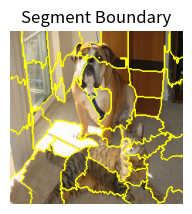

In [19]:
with plt.rc_context(rc=rc):
    fig, ax = plt.subplots(figsize=(figsize, figsize))
    lime.draw_boundary(ax=ax)
    fig.tight_layout()
    plt.show()
    plt.clf()
    plt.close()

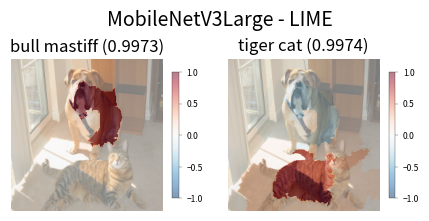

In [20]:
draw_two_heatmaps(
    model=lime,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

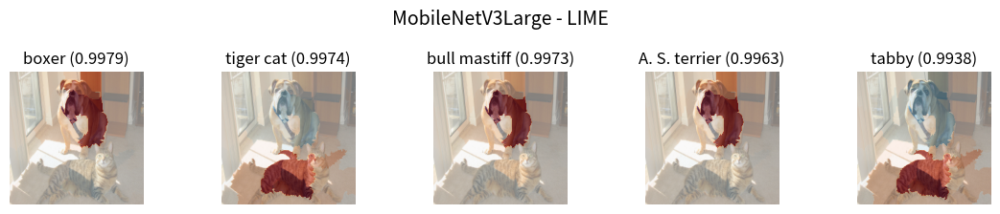

In [21]:
draw_topn_label(
    model=lime,
    target="last",
    option=draw_option,
)

# Motivation

* 画像に犬が写っている時に、AI は画像のどこを見て「犬だ」と判断しているのかを知りたい
    * ＝「Activation Mapping」
    * AI が示す Activation Mapping が、人間が「犬だ」と判断する場所と同じならば、AI は人間と同じ判断基準で「犬だ」と判断している
    * （蛇足）Activation Mapping が、人間が「犬だ」と判断する場所と異なる場合：
        * （CNNモデルの学習の問題）学習が足りていない、学習し過ぎている（過学習）
        * （CNNモデルの構造の問題）Neural Network の構成が単純過ぎる、複雑過ぎる
        * （特徴の発見）人間が認識し得ない何かを見て判断している
        * （データの問題）データ（画像）に犬・猫以外の何らかの特徴があり、そこを見て判断してしまっている
        * （CAMモデルの問題）Activation Mapping を計算したモデルの何かが間違っている
* 画像に犬と猫が写っている場合、「犬だ」とする場合には、犬の場所だけを見て、猫の場所を『見ないで』いて欲しい
    * （蛇足）「Inactivation Mapping」（私の作った言葉）
        * 通常の CAM モデルの良さを測る指標は Inactivation Mapping を考慮しないため、通常の CAM モデルはこれを削除している
        * 私はここにも興味があったため、各論文に記載されているロジックに加え、Inactivation Mapping も計算するよう実装している
* CNN Classifier を使い、ラベルとして「犬」を与えた場合は犬の場所、「猫」を与えた場合は猫の場所を示すものを作りたい

# （蛇足１）CNN Classifier

* CNN: Convolutional Neural Network
    * Conv. Layer を持つ Neural Network モデル
    * 一般的に Neural Network は階層（Layer）が積み重なっているものであり、入力データ（画像）を次々に階層に通過させ、最終的な予測結果を得る
    * 一般的な CNN の作りは、Conv. Layer を含む様々な階層を積み重ね、最後に Linear Layer（線形結合層）を付けるというもの
        * [torchvision](https://pytorch.org/vision/stable/index.html) が提供しているモデルは、様々な階層を積み重ねた部分を、画像の特徴量生成するものとして feature、最後の Linear Layer（の集まり）の部分を、最終的に分類するものとして classifier と名付けてられている
* Classifier（分類器）
    * 予め設定されたカテゴリに対し、画像にどの種類のものが写っているかを学習し、そして予測（分類: classify）するもの
    * （蛇足）クラス（class）、カテゴリ（category）、ラベル（label）
        * どれも日本語にすると「種類」
        * カテゴリは全部の種別をまとめた集合、ラベルは個々の画像に付けられた種別、クラスは同じ種別を持つ画像の集まりを指すことが多い
        * classify や categorize, labeling もしくは annotation とも言うし
        * まぁ、あんまり気にしない方が良いと思う
    * 学習に使う画像には、複数の種類（犬と猫）が写っているような写真は無い、と思う
* 犬と猫の両方が写っている写真の分類
    * 一般的に Classifier はひとつのラベルしか出力しない
    * これは最も高いスコアであったラベルを出力しただけであり、内部的にはすべてのラベルに対してスコアを計算している
    * なので、直接ラベルを指定するか、もしくはランク（順位）を指定すればよい
    * ただし、あまりに低いランクのものを指定しても、滅茶苦茶なものが出てくる
        * だってそのラベルだと予測してないから！

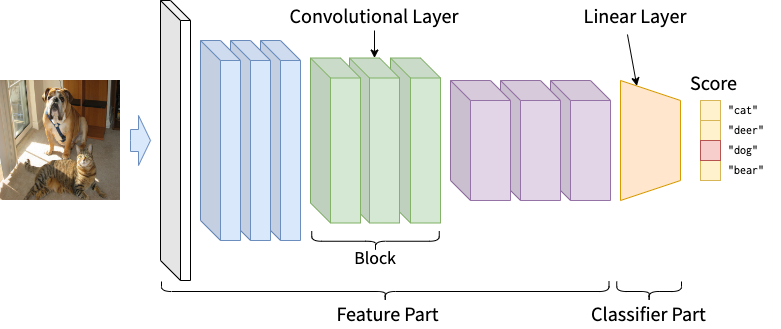

In [22]:
Image.open("cnn.png")

# （蛇足２） Conv. Layer

* Conv. Layer (Convolutional Layer: 畳み込みレイヤ)
    * 入力画像もしくは直前の層の出力の、ある一部の領域（kernel）の値をまとめあげて出力をするもの
        * kernel が 3 x 3 である場合、画像に対して 3 x 3 の領域をずらしつつ適用する
        * 実際の計算は、自身が保持しているの重み（特徴）との内積
    * 画像から特徴を抽出するという操作に相当する
        * 特徴が「右肩上がり斜めの線」というものであった場合、画像のどこに右肩上がり斜めの線があるかを抽出する
* Conv. Layer の channel
    * 抽出したい特徴にはさまざまな種類のものがある
        * 右肩上がりの斜めの線、左肩上がりの斜めの線、真っ直ぐな線・・・
    * そこで、Conv. Layer は channel という名前で複数の特徴（重み）を持ち、入力に対して並列に計算する
* モデル内の Conv. Layer
    * 一般的に、モデルは複数の Conv. Layer を階層的に持つ
    * データを Conv. Layer に通すと、サイズが小さくなる
        * 何回も Conv. Layer に通すと、サイズはどんどん小さくなる
    * 最初の方の Conv. Layer は画像の細かな部分の特徴を抽出し、最後の方の Conv. Layer は画像の全体的な特徴を抽出する、ということに相当する
        * 最初の方は狭い範囲で見た時の線の一部、最後の方は広い範囲で見た時の丸い形、のように
* 対象 Conv. Layer には、一般的に任意の階層のものを設定できるが、ここでは以下に統一する
    * ひとつの Conv. Layer を使う場合：モデル内の最後の Conv. Layer
    * 複数の Conv. Layer を使う場合：モデル内の全部の Conv. Layer

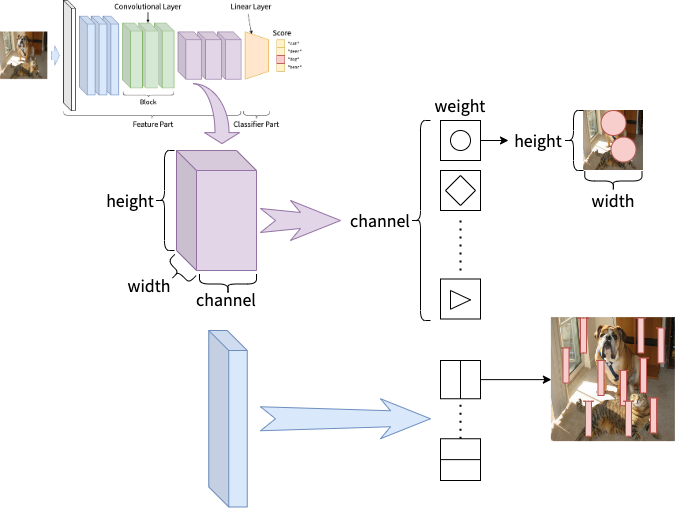

In [23]:
Image.open("conv.png")

# （蛇足３）一般的な Neural Network の学習

* 入力データを forward させて、スコアを得る
* 正解とスコアの誤差（loss）を計算し、その誤差を逆伝播（backword）させる
* 差分から重みを更新することによって、より良い重み（特徴）になるようにし、精度を向上させる
    * 簡単に説明すると、
    * 犬の画像を入れた時に、スコアとして「犬: 0.8、猫: 0.3」と出たとする
    * 正解は「犬: 1.0、猫: 0.0」であるので、犬ラベルの誤差は 0.2、猫ラベルの誤差は -0.3 である
        * 本当は誤差はひとつの値にまとめなきゃいけないけど、考え方としては上記
    * これを逆から伝えていって、差分を重みに反映させることによって、良い特徴はより強調され、悪い特徴は打ち消されていく
* これを誤差逆伝播法（Back Propagation）という

# Class Activation Mapping (CAM) の概要

## Activation

* 予めモデルに hook させた関数により、順伝播（forward）時の Conv. Layer の出力（activation）を取得する
* forward
    * モデルに画像を入力し、予測結果を出力すること
* activation
    * Conv. Layer が持つ特徴（重み）が、画像のどこにあるかという情報
    * Neural Network らしく、ニューロンが発火（活性化）した場所という意味で、activation map と呼ぶこともある
    * 画像の特徴の位置という意味で、feature map と呼ぶこともある
    * ここでは統一して "activation" とする

## Class Activation Mapping

* Conv. Layer の各 channel から得られた activation は、各 channel の持つ特徴が画像のどこにあるかという情報
* しかし、欲しいのは「画像をそのラベルだと判定した時に、画像のどこを見たか」という情報
* なので、指定されたラベル（class）に対して、「どの特徴を参照してそのラベルだと判断したのか」という weight（重み）を考える
* activation と weight をゴニョゴニョすれば、最終的に「どこを見たか」という情報になるはず
    * 最終的に、画像のどこを見たかを表すものを、saliency map（特色マップ）と呼ぶ
* ここでは、saliency map を heatmap に変換して元画像に重ね合わせることによって CAM を可視化する
    * CAM の良さを測る指標にはいくつかあるが、それはまた難しいので別の機会に

## Gradient

* 予めモデルに hook させた関数により、逆伝播（backward）時の Conv. Layer の出力（gradient）を取得する
    * 元々逆伝播時の出力は、結果からの誤差（差分）、すなわち勾配なので、gradient と呼ぶ
    * gradient を使わない CAM モデルもある
* CAM モデルでは、学習時の Back Propagation と異なり、loss を計算するのではなく、指定したラベルの値（スコア）をそのまま backward させる
* そもそも CAM モデルで使う CNN Classifier は、train モードじゃなくて eval モードにするので、backward させても重みは更新されず、ただ値を逆伝播するだけ
* すると gradient は「そのラベルだと判断するに至った効果」を示すことになる
* これって weight に近いよね？

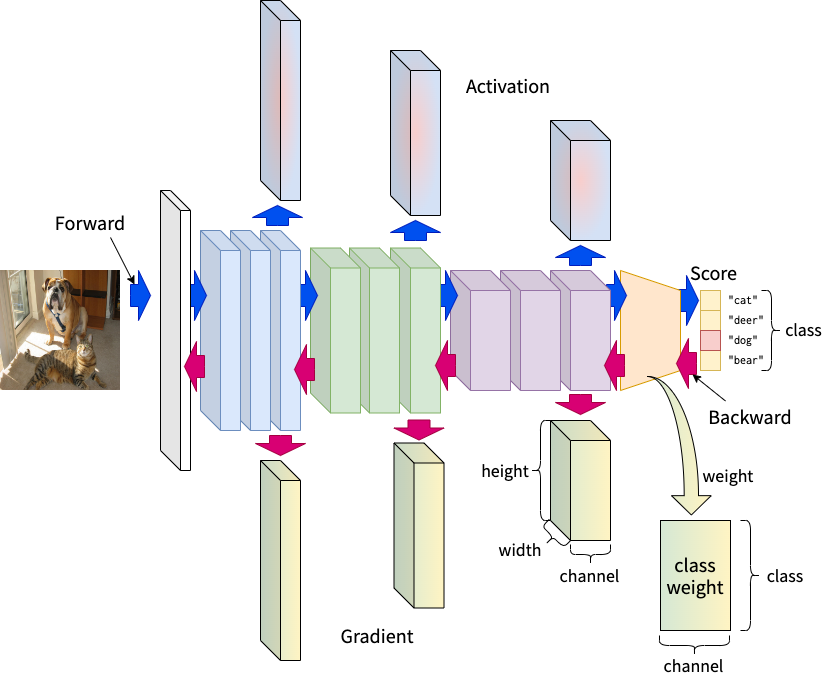

In [24]:
Image.open("forward.png")

## CAM の要点

ほぼすべての CAM モデルの処理は、以下の３つに分割される。

1. Activation に何らかの weight をかける
1. channel をグループ分け（clustering）する
1. channel （のグループ）毎に weight をかけ、マージする

CAM の各モデルは、上記３点のいずれかに特徴がある。この３点ごとに紹介する。

# 実装上のオリジナル点

* 「見ていない」領域の表示
    * 各 CAM モデルはどれもこれも、saliency map の中の負の値をノイズだとして除去している
    * しかし、ここでは「見ていない」領域も見たいので、負の値を取り除く処理（特に ReLU）を至る所で削除している
        * CAM の精度を測る各指標では、「見ていない」という情報は邪魔でしかないから
    * なので、ここでの実装は、どれも元論文に忠実ではない
        * 取り除いている箇所には一応コメントを残している
* InteGrad-CAM
    * IntegratedGrad と Grad-CAM を組み合わせた、InteGrad-CAM を作った
* Cosine-CAM
    * Group-CAM をちょっと工夫した、Cosine-CAM を作った
* オリジナルな CAM を作れる
    * 上記３点に関して、自分の好きなものを自由に組み合わせて使えるように実装した

# 対応モデル

In [25]:
from cam import CAM


CAM.show_cnn_models()

* MobileNetV3Small
* MobileNetV3Large
* VGG11
* VGG13
* VGG16
* VGG19
* ResNet18
* ResNet34
* ResNet50
* ResNet101
* ResNet152
* ResNeXt50_32X4D
* ResNeXt101_32X8D
* ResNeXt101_64X4D
* WideResNet50_2
* WideResNet101_2

In [26]:
CAM.show_cam_models()

* Dummy-CAM
* Fake-CAM
* CAM
* Grad-CAM
* Grad-CAM++
* SmoothGrad-CAM++
* InteGrad-CAM
* XGrad-CAM
* HiRes-CAM
* Eigen-CAM
* EigenGrad-CAM
* Ablation-CAM
* Score-CAM
* Group-CAM
* Cluster-CAM
* Cosine-CAM
* Poly-CAM
* Base-CAM
* LIME

# CAM・・・の前に

## Dummy-CAM

* Activation を生のまま見るために作った、何もしない CAM

In [27]:
dummycam: CAM = CAM(cam_model="Dummy-CAM", **init_option)

In [28]:
dummycam.show_conv_layers()

|   block | shape        | is_last   | offset   | name                  |
|--------:|:-------------|:----------|:---------|:----------------------|
|       1 | 1x16x112x112 | True      | 0        | features.1.block.1.0  |
|       2 | 1x24x56x56   | False     |          | features.2.block.2.0  |
|       3 | 1x24x56x56   | True      | 1        | features.3.block.2.0  |
|       4 | 1x40x28x28   | False     |          | features.4.block.3.0  |
|       5 | 1x40x28x28   | False     |          | features.5.block.3.0  |
|       6 | 1x40x28x28   | True      | 2        | features.6.block.3.0  |
|       7 | 1x80x14x14   | False     |          | features.7.block.2.0  |
|       8 | 1x80x14x14   | False     |          | features.8.block.2.0  |
|       9 | 1x80x14x14   | False     |          | features.9.block.2.0  |
|      10 | 1x80x14x14   | False     |          | features.10.block.2.0 |
|      11 | 1x112x14x14  | False     |          | features.11.block.3.0 |
|      12 | 1x112x14x14  | True      | 3        | features.12.block.3.0 |
|      13 | 1x160x7x7    | False     |          | features.13.block.3.0 |
|      14 | 1x160x7x7    | False     |          | features.14.block.3.0 |
|      15 | 1x160x7x7    | False     |          | features.15.block.3.0 |
|      16 | 1x960x7x7    | True      | 4        | features.16.0         |

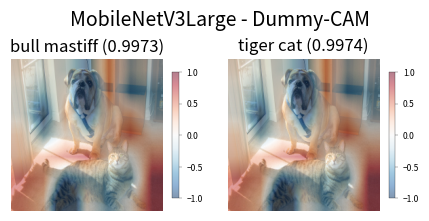

In [29]:
draw_two_heatmaps(
    model=dummycam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

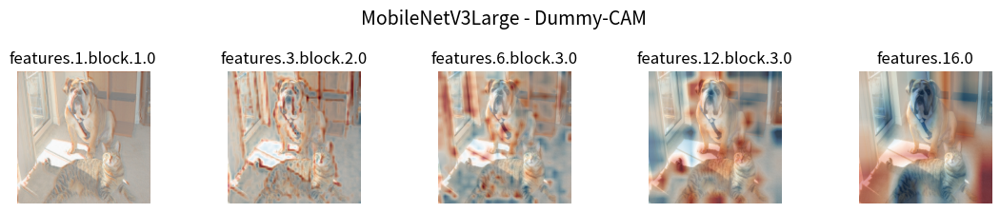

In [30]:
draw_all_convs(
    model=dummycam,
    label=label_dog,
    option=draw_option,
)

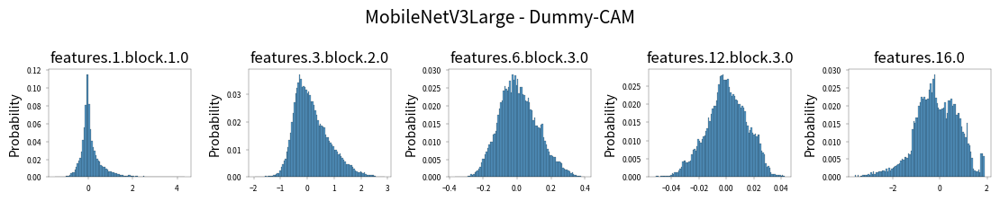

In [31]:
check_distribution(
    model=dummycam,
    label=label_dog,
    option=draw_option,
)

## Fake-CAM

* [Revisiting The Evaluation of Class Activation Mapping for Explainability: A Novel Metric and Experimental Analysis](https://arxiv.org/abs/2104.10252)
    * S. Poppi, et al.
    * CVPR (Conference on Computer Vision and Pattern Recognition) 2021
* CAM の良さを測る指標の baseline となるもの
* ほぼすべて１（Acvite）で、左上の１点だけ０

In [32]:
fakecam: CAM = CAM(cam_model="Fake-CAM", **init_option)

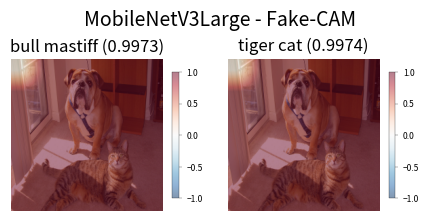

In [33]:
draw_two_heatmaps(
    model=fakecam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

# Activation の Weight を頑張ったモデル

* CAM
    * classifier 部の weight（class weight）を重みとする
* Grad-CAM
    * Gradient を channel 毎に位置に関して平均したものを重みとする
* Grad-CAM++
    * Gradient（傾き）の２階微分が 0 になるという条件を追加し、滑らかにした
* Smooth Grad-CAM++
    * 元画像にノイズを入れたものを何個か計算し、それらを平均してさらに ++ することで、さらに滑らかにした
* InteGrad-CAM（オリジナル）
    * ノイズから徐々に元画像にしていく過程を経路積分のように計算して、滑らかな Graident を求める
* XGrad-CAM
    * 境界条件とかを加えて滑らかにする、が、ぶっちゃけ、Gradient * Ativation が滑らかな Gradient である
* HiRes-CAM
    * 位置に関して平均するのではなく、そのまま使うことで、高解像度な Saliency Map を作る

## CAM

* [Learning Deep Features for Discriminative Localization](https://arxiv.org/abs/1512.04150)
    * B.Zhou, et al.
    * CVPR (Conference on Computer Vision and Pattern Recognition) 2016
* 良い点：
    * LIME のようにサンプリングも特徴量生成もする必要がなく、非常に高速で軽量
    * classifier って結局、どの channel がどのラベルに効いたかなので、シンプルにそれを掛けるだけで良い
* 悪い点：
    * Conv. Layer が絶対最後のヤツでなきゃならない（CNNの実装に強く依存）

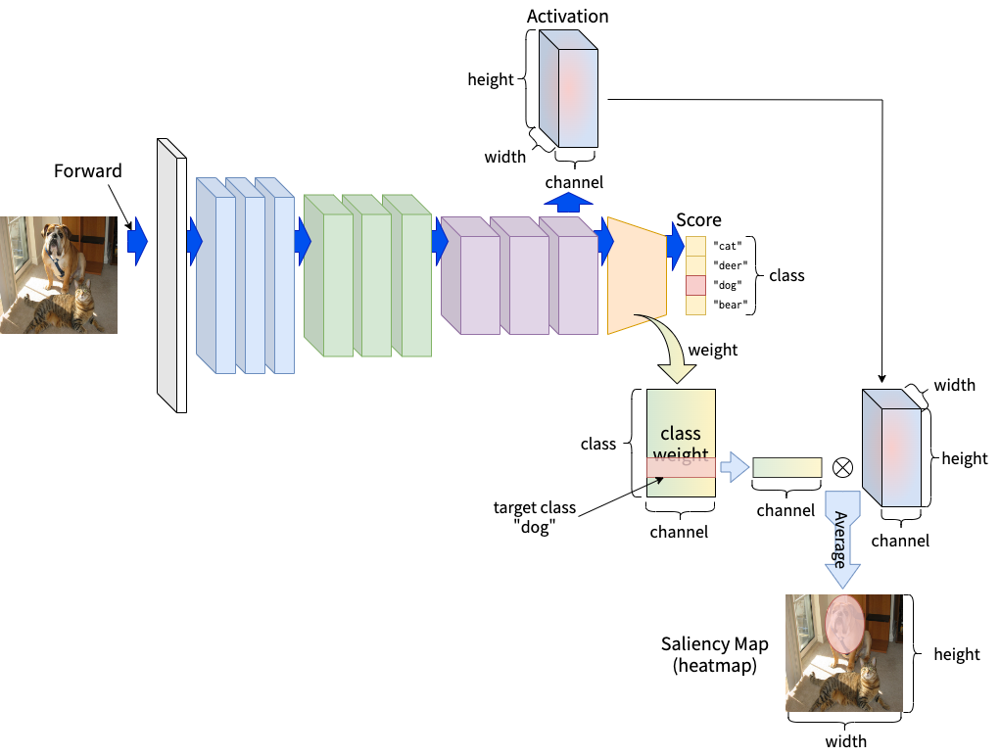

In [34]:
Image.open("cam.png")

In [35]:
vanillacam: CAM = CAM(cam_model="CAM", **init_option)

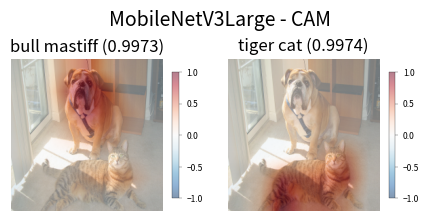

In [36]:
draw_two_heatmaps(
    model=vanillacam,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

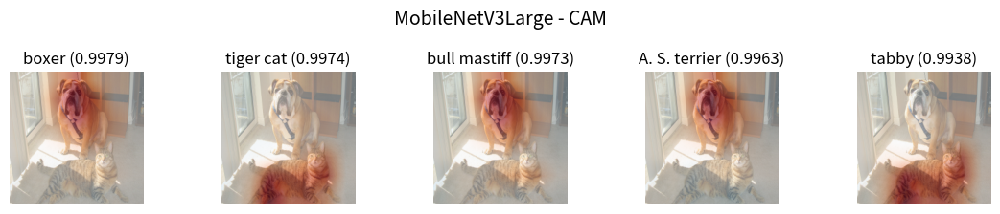

In [37]:
draw_topn_label(
    model=vanillacam,
    target="last",
    option=draw_option,
)

## Grad-CAM

* [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391)
    * R. Selvaraju, et al.
    * ICCV (International Conference on Computer Vision) 2017
* 良い点：
    * Gradient を取るだけで良いので、CNN の実装にまったく依存しないし、簡単
* 悪い点：
    * ちょっとでも画像が違うと、Saliency Map はがらりと変わってしまう（Gradient は不安定）

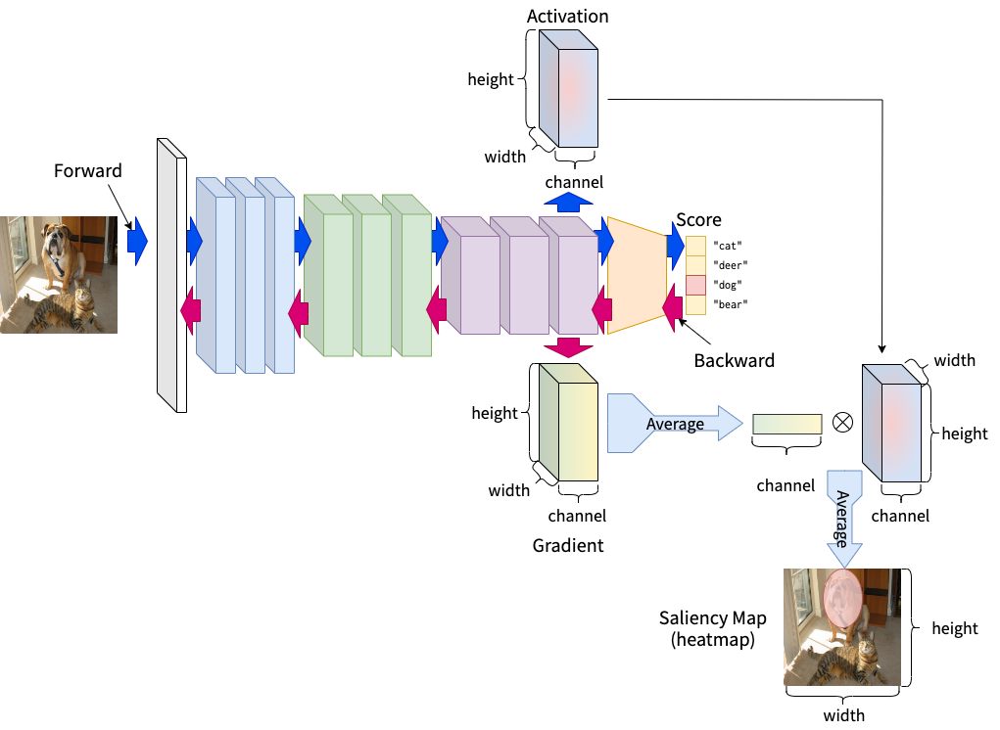

In [38]:
Image.open("gradcam.png")

In [39]:
gradcam: CAM = CAM(cam_model="Grad-CAM", **init_option)

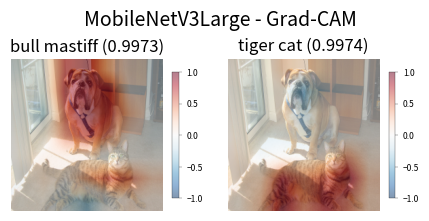

In [40]:
draw_two_heatmaps(
    model=gradcam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

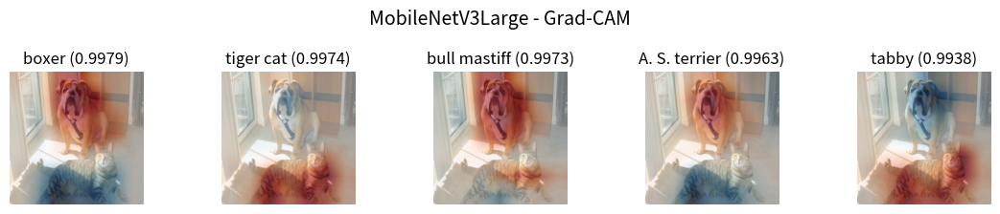

In [41]:
draw_topn_label(
    model=gradcam,
    target=target_last,
    option=draw_option,
)

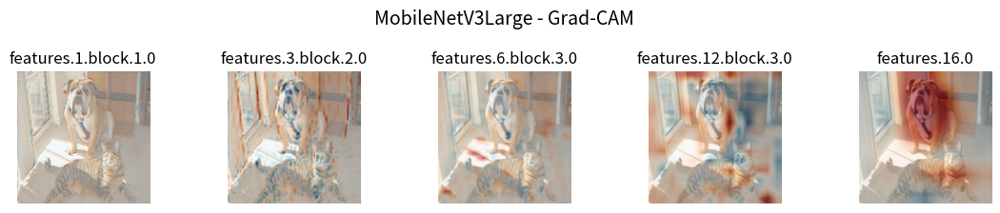

In [42]:
draw_all_convs(
    model=gradcam,
    label=label_dog,
    option=draw_option,
)

## Grad-CAM++

* [Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks](https://arxiv.org/abs/1710.11063)
    * A. Chattopadhyay, et al.
    * WACV (Winter Conference on Applications of Computer Vision) 2018
* 良い点：
    * 傾き（Gradient）の２階微分が 0 になるという仮定を導入して weight を計算し、滑らかにする
* 悪い点：
    * 計算量が増える

In [43]:
gradcampp: CAM = CAM(cam_model="Grad-CAM++", **init_option)

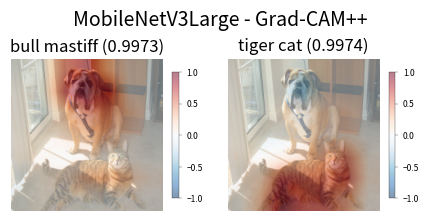

In [44]:
draw_two_heatmaps(
    model=gradcampp,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

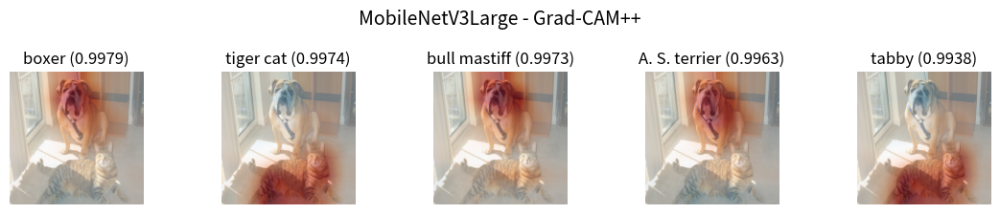

In [45]:
draw_topn_label(
    model=gradcampp,
    target=target_last,
    option=draw_option,
)

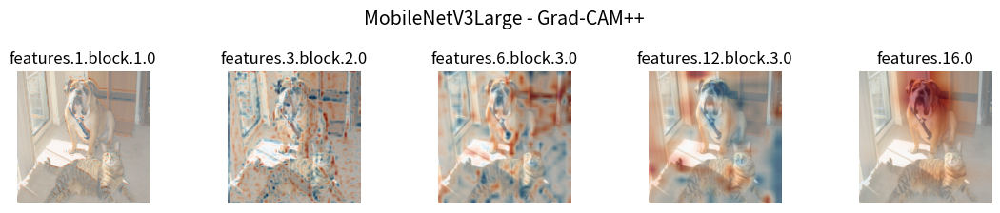

In [46]:
draw_all_convs(
    model=gradcampp,
    label=label_dog,
    option=draw_option,
)

## Smooth Grad-CAM++

* [Smooth Grad-CAM++: An Enhanced Inference Level Visualization Technique for Deep Convolutional Neural Network Models](https://arxiv.org/abs/1908.01224)
    * D. Omeiza, et al.
    * IntelliSys (Intelligent Systems Conference) 2019
* 良い点：
    * SmoothGrad の考え方を導入して、さらに滑らかに
        * [SmoothGrad: removing noise by adding noise](https://arxiv.org/abs/1706.03825)
        * D. Smilkov, et al.
        * arXiv 2017
* 悪い点：
    * さらに計算量が増える

In [47]:
smoothgradcampp: CAM = CAM(cam_model="SmoothGrad-CAM++", **init_option)

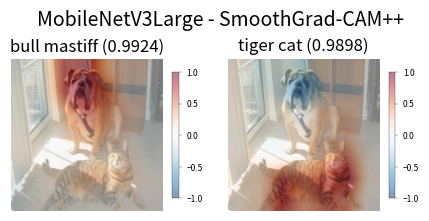

In [48]:
draw_two_heatmaps(
    model=smoothgradcampp,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

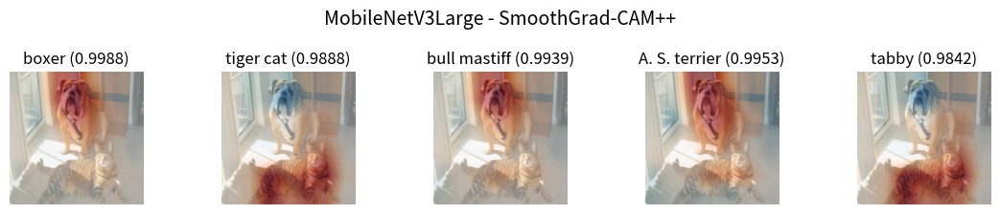

In [49]:
draw_topn_label(
    model=smoothgradcampp,
    target=target_last,
    option=draw_option,
)

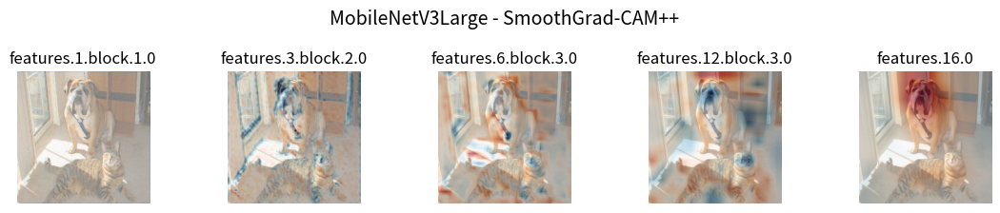

In [50]:
draw_all_convs(
    model=smoothgradcampp,
    label=label_dog,
    option=draw_option,
)

## InteGrad-CAM

* [Axiomatic Attribution for Deep Networks](https://arxiv.org/abs/1703.01365) (IntegratedGrad)
    * M. Sundararajan, et al.
    * ICML (International Conference on Machine Learning) 2017
* 良い点：
    * SmoothGrad は、++ しないと Smooth すぎる（満遍なく赤くなっちゃう）
    * IntegraGrad だと、++ しなくても結構良い
    * IntegratedGrad + Grad-CAM で InteGrad-CAM って、我ながら良いネーミング

In [51]:
integradcam: CAM = CAM(cam_model="InteGrad-CAM", **init_option)

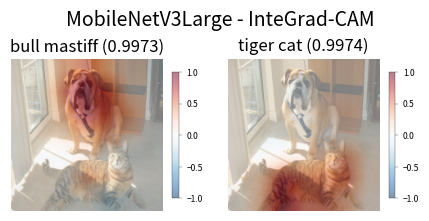

In [52]:
draw_two_heatmaps(
    model=integradcam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

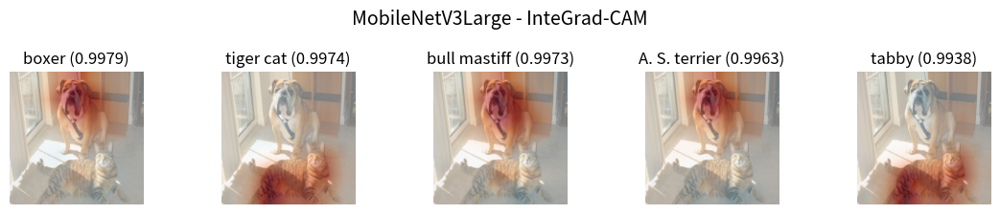

In [53]:
draw_topn_label(
    model=integradcam,
    target=target_last,
    option=draw_option,
)

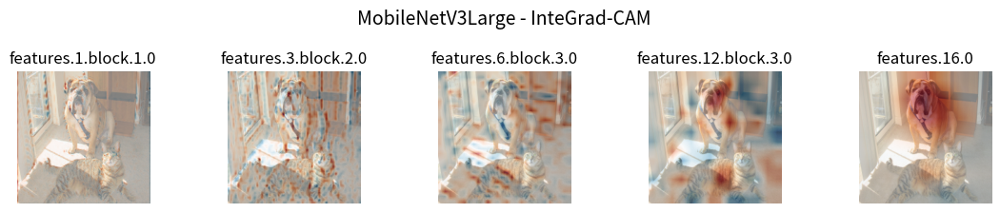

In [54]:
draw_all_convs(
    model=integradcam,
    label=label_dog,
    option=draw_option,
)

## XGrad-CAM

* [Axiom-based Grad-CAM: Towards Accurate Visualization and Explanation of CNNs](https://arxiv.org/abs/2008.02312)
    * R. Fu, et al.
    * BMVC (British Machine Vision Conference) 2020
* 導出：
    * Sensitivity: 特徴量の内のある位置の注目度は、全体の注目度から特定の位置を取り除いた場合の注目度を引いたものとして定義できる
        * 位置に関する Ablation だと思えば良い
    * Consavation: 全部の位置の注目度を合計すると、全体の注目度になる
    * この２つの公理（Axiom）を満たすように Loss Function を定義し、この最小化問題を解く
* 結局：
    * gradient と activation を掛けたものが weight
* 導出は難しいけど、実装が非常にシンプルで美しい

In [55]:
xgradcam: CAM = CAM(cam_model="XGrad-CAM", **init_option)

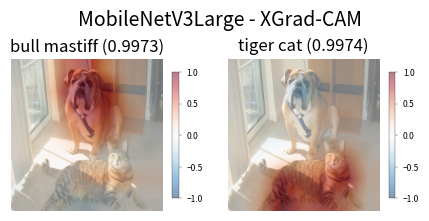

In [56]:
draw_two_heatmaps(
    model=xgradcam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

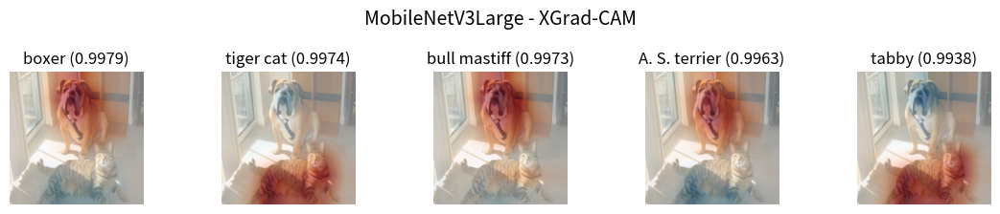

In [57]:
draw_topn_label(
    model=xgradcam,
    target=target_last,
    option=draw_option,
)

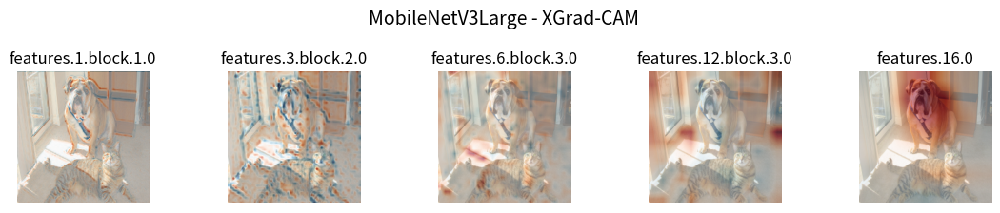

In [58]:
draw_all_convs(
    model=xgradcam,
    label=label_dog,
    option=draw_option,
)

## HiRes-CAM

* [Use HiResCAM instead of Grad-CAM for faithful explanations of convolutional neural networks](https://arxiv.org/abs/2011.08891)
    * R. Draelos, et al.
    * arXiv 2020
* Grad-CAM は gradient を channel 毎に平均して、各 channel の重みとした
* そうじゃなくて、gradient をそのまま activation にかけてしまえば、位置毎に重みをかけることになり、逆に良いんじゃないか説

In [59]:
hirescam: CAM = CAM(cam_model="HiRes-CAM", **init_option)

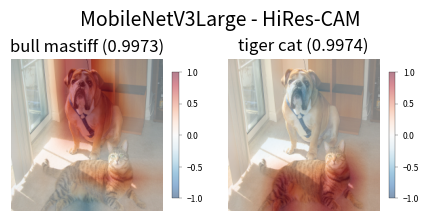

In [60]:
draw_two_heatmaps(
    model=hirescam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

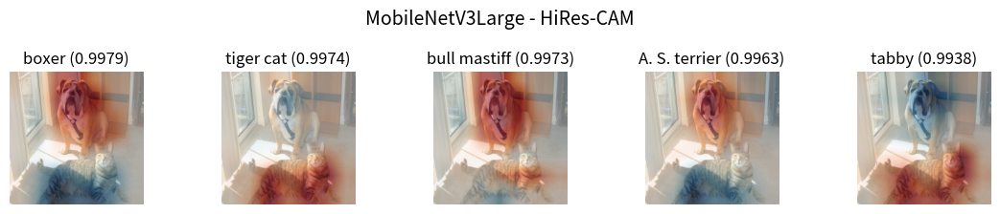

In [61]:
draw_topn_label(
    model=hirescam,
    target=target_last,
    option=draw_option,
)

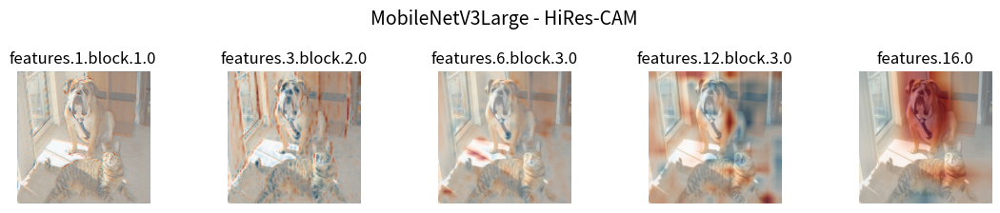

In [62]:
draw_all_convs(
    model=hirescam,
    label=label_dog,
    option=draw_option,
)

# （蛇足４）SVD のデータ分析的解釈

* [SVD](https://ja.wikipedia.org/wiki/%E7%89%B9%E7%95%B0%E5%80%A4%E5%88%86%E8%A7%A3) (Singular Value Decomposition: 特異値分解)
* 客が u 人、商品が v 個あって、客がそれぞれどの商品を何個買ったのかのデータ（UV）があるとする
    * UV は u x v 行列
    * 客が４人、商品が３個の例を下に示す

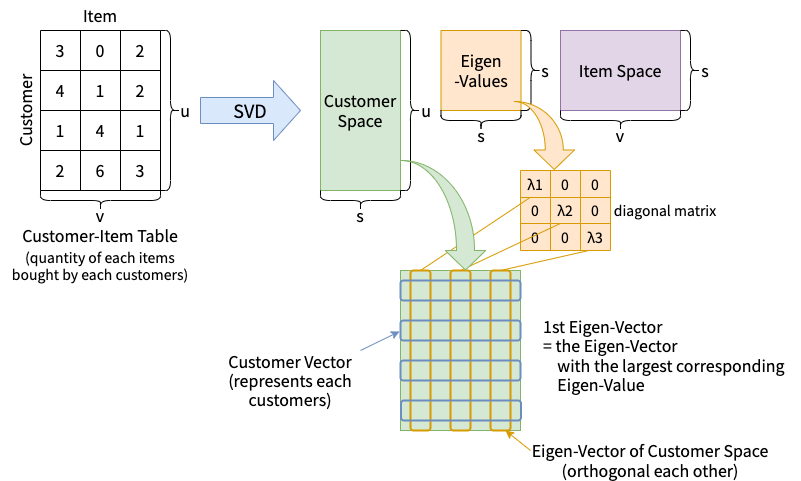

In [63]:
Image.open("svd.png")

In [64]:
import torch
from torch import Tensor


UV: Tensor = torch.tensor(
    [
        [3, 0, 2],
        [4, 1, 2],
        [1, 4, 1],
        [2, 6, 3],
    ],
    dtype=torch.double,
)

* これを SVD することによって、US, SS, SV の３つの行列に分けることが出来る
* US は u x s 行列、SS は s x s 行列、SV は s X v 行列
    * s は min(u, v) 以下の値
    * しかし、s を min(u, v) 未満にするには、scikit-learn.decomposition.TruncatedSVD が必要
        * これを使ってデータの次元圧縮をする事ができる
    * numpy および torch の svd では、s = min(u, v)
    * SS は絶対に対角行列なので、s 個の対角成分しか出力されない（ベクトルとして出力される）

In [65]:
US, SS, SV = torch.linalg.svd(UV, full_matrices=False)
US.shape, SS.shape, SV.shape

(torch.Size([4, 3]), torch.Size([3]), torch.Size([3, 3]))

* US @ diag(SS) @ SV をすれば、元に戻る
    * `@` は行列の掛け算（`*` は行列の要素毎の掛け算）

In [66]:
(US @ torch.diag(SS) @ SV).round().to(torch.int)

tensor([[3, 0, 2],
        [4, 1, 2],
        [1, 4, 1],
        [2, 6, 3]], dtype=torch.int32)

* US, SV について
    * US の s 個の縦ベクトルを U、SV の s 個の横ベクトルを V とする
        * U は u 次元、V は v 次元のベクトル（それぞれ客の種類、商品の種類の次元を持つ）
    * s 個の U 同士、s 個の V 同士は互いに直交する
    * すなわち、US は元の UV 行列の客 u に関する固有ベクトル（の集合）、SV は元の UV 行列の商品 v に関する固有ベクトル（の集合）と言える

In [67]:
for i in range(US.shape[1]):
    for j in range(i + 1, US.shape[1]):
        print(
            f"Eigen-Vector U[{i}] @ U[{j}] :",
          (US[:, i].view(1, -1) @ US[:, j].view(-1, 1)).round(decimals=4)
        )
for i in range(SV.shape[0]):
    for j in range(i + 1, SV.shape[0]):
        print(
            f"Eigen-Vector V[{i}] @ V[{j}] :",
            (SV[i, :].view(1, -1) @ SV[j, :].view(-1, 1)).round(decimals=4)
        )

Eigen-Vector U[0] @ U[1] : tensor([[-0.]], dtype=torch.float64)
Eigen-Vector U[0] @ U[2] : tensor([[-0.]], dtype=torch.float64)
Eigen-Vector U[1] @ U[2] : tensor([[0.]], dtype=torch.float64)
Eigen-Vector V[0] @ V[1] : tensor([[0.]], dtype=torch.float64)
Eigen-Vector V[0] @ V[2] : tensor([[-0.]], dtype=torch.float64)
Eigen-Vector V[1] @ V[2] : tensor([[-0.]], dtype=torch.float64)


* US, SV について（続き）
    * 各 U, V は 各々 L2-Norm（長さ）が 1 になっている
    * US の横ベクトル（s 次元）を客ベクトル、SVの縦ベクトル（s 次元）を商品ベクトルと呼ぶことにする
    * これら客ベクトル・商品ベクトルの各要素は、s 個の特徴に対して、それらをどの程度持つか（持たないか）を表す
* よって、SVD は客-商品行列 UV を、客情報（客空間）US と商品情報（商品空間）SV とに分割する、と言うことが出来る

In [68]:
for i in range(US.shape[1]):
    print(
        f"L2-Norm U[{i}] :",
        torch.linalg.norm(US[:, i], ord=2)
    )
for i in range(SV.shape[0]):
    print(
        f"L2-Norm V[{i}] :",
        torch.linalg.norm(SV[i, :], ord=2)
    )

L2-Norm U[0] : tensor(1.0000, dtype=torch.float64)
L2-Norm U[1] : tensor(1.0000, dtype=torch.float64)
L2-Norm U[2] : tensor(1., dtype=torch.float64)
L2-Norm V[0] : tensor(1.0000, dtype=torch.float64)
L2-Norm V[1] : tensor(1.0000, dtype=torch.float64)
L2-Norm V[2] : tensor(1.0000, dtype=torch.float64)


* SS について
    * SS は対角行列なので、SS[i, i] * US[:, i] * SV[i, :] を i = 0, 1, 2 でやると、元に戻る
    * そもそも SS は[特異値](https://ja.wikipedia.org/wiki/%E7%89%B9%E7%95%B0%E5%80%A4)であり、まぁ簡単に言うと、正方行列じゃない行列の固有値である

In [69]:
torch.stack([SS[i] * US[:, [i]] * SV[[i], :] for i in range(3)]).sum(
    dim=0
).round().to(torch.int)

tensor([[3, 0, 2],
        [4, 1, 2],
        [1, 4, 1],
        [2, 6, 3]], dtype=torch.int32)

* SS の値について
    * SS は固有値みたいなものなので、UV.T @ UV をして正方行列にしたやつの行列式の平方根と、SS を全部かけたやつは、値が一致する
        * UV は正方行列じゃないので、行列式的なものをみるために、強引に転置を掛けている
        * UV が正方行列ならば、元の行列の行列式と SS を全部かけ合わせたやつは値が一致して、これは当たり前に固有値分解だからである
    * これに対して、上で SS を再構成した US[:, i] * SV[i, :] を同様に転置を掛けて行列式を計算すると、全部０である
    * これはすなわち、UV が SVD によって綺麗に客情報と商品情報に分かれたということを意味している
    * さらに、元の UV の行列式で表される意味は、すべて特異値である SS に入ってしまっているということも意味している
    * PCA（Principal Component Analysis: 主成分分析）でも同じなのだが、特異値、すなわち固有値、もっと砕けて言うと、分散は、データの説明力、すなわちデータに含まれている意味の重さを表す
        * PCA の cumsum explained ratio が 0.8 を超える最小次元数でデータ圧縮をする、ということと同じ
    * ということは、SS の値が最も大きい位置に対応する US・VS の U ベクトル・V ベクトルが、US, VS の中で最も説明力が大きい、最も意味があるベクトルということになる

In [70]:
from functools import reduce
from operator import mul


(
    torch.linalg.det(UV.T @ UV).round(decimals=4).sqrt(),
    round(reduce(mul, SS.detach().cpu().numpy()), 4),
)

(tensor(30.4467, dtype=torch.float64), 30.4467)

In [71]:
for i in range(3):
    m: Tensor = US[:, [i]] * SV[[i]]
    print(torch.linalg.det(m.T @ m).round(decimals=4))

tensor(0., dtype=torch.float64)
tensor(-0., dtype=torch.float64)
tensor(-0., dtype=torch.float64)


In [72]:
SS

tensor([8.9673, 4.4734, 0.7590], dtype=torch.float64)

# Channel (Group) の Weight を頑張ったモデル

Activation の Weight を頑張る限り、Gradient は避けて通れない。しかし Gradient には不安定という大問題がある。
そこで Gradient をすっぱり諦め、別の方法で channel 毎の weight を見積もることで
CAM を実現する。

* Eigen-CAM
    * Saliency Map を channel-position 平面に変形し、さらに SVD で channel と position に分割し、その channel の 1st Eigen-Vector を channel の重みとする
* Ablation-CAM
    * Saliency Map から channel をひとつだけ削除し（Ablation）、スコアが悪くなったら、その悪くなった差分がその channel の weight
* Score-CAM
    * Saliency Map から channel をひとつだけ取り出し（Abscission）、それをマスクとして元画像にかけ CNN に通し、スコアの差分がその channel の weight
        * Abscission は私が付けた名前

注） Gradient を使わない、とは言ってない

## Eigen-CAM

* [Eigen-CAM: Class Activation Map using Principal Components](https://arxiv.org/abs/2008.00299)
    * M. Muhammad, et al.
    * IJCNN (International Joint Conference on Neural Networks) 2020
* Score も Gradient も使わず、純粋に Activation だけで weight を作ってしまう（すごい）
* なので、「ラベルは何か」という情報がいっさい加わっていない
* 常に「トップランクの Saliency Map」が作れる

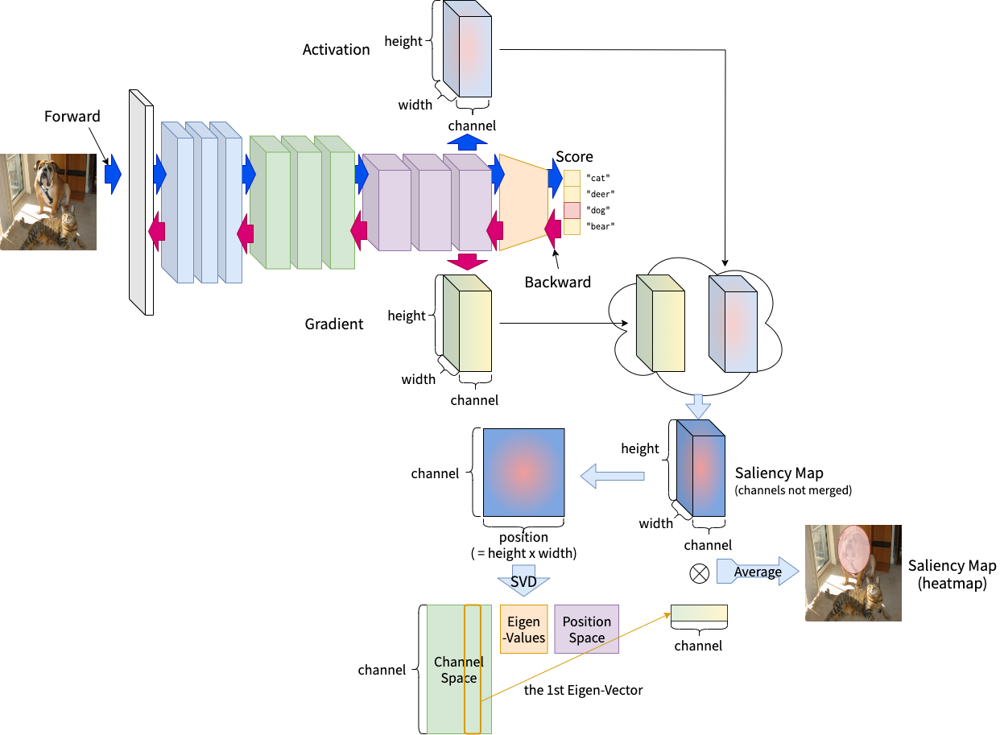

In [73]:
Image.open("eigencam.png")

In [74]:
eigencam: CAM = CAM(cam_model="Eigen-CAM", **init_option)

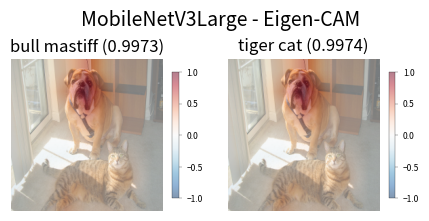

In [75]:
draw_two_heatmaps(
    model=eigencam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

## EigenGrad-CAM

* Eigen-CAM は activation しか使ってなくてすごい
* でも score も gradient も使わないから、top rank のものしかだめ
* Grad-CAM と組み合わせると、良い感じになる

In [76]:
eigengradcam: CAM = CAM(cam_model="EigenGrad-CAM", **init_option)

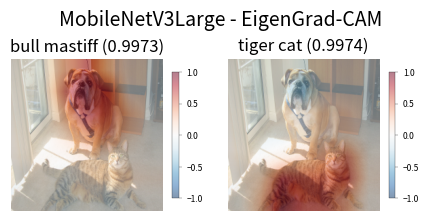

In [77]:
draw_two_heatmaps(
    model=eigengradcam,
    target=target_last,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

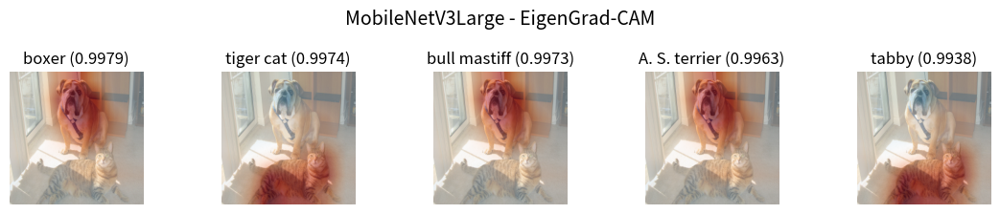

In [78]:
draw_topn_label(
    model=eigengradcam,
    target=target_last,
    option=draw_option,
)

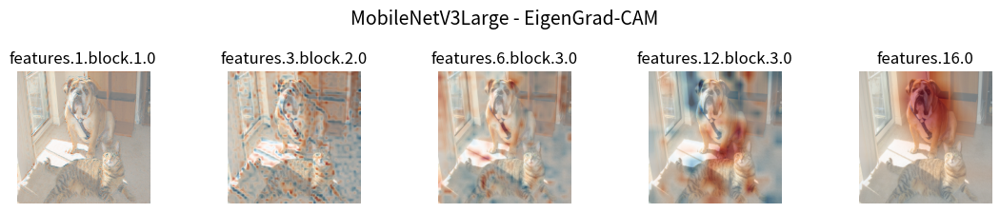

In [79]:
draw_all_convs(
    model=eigengradcam,
    label=label_dog,
    option=draw_option,
)

## Ablation-CAM

* [Ablation-CAM: Visual Explanations for Deep Convolutional Network via Gradient-free Localization](https://openaccess.thecvf.com/content_WACV_2020/html/Desai_Ablation-CAM_Visual_Explanations_for_Deep_Convolutional_Network_via_Gradient-free_Localization_WACV_2020_paper.html)
    * H. Ramaswamy, et al.
    * WACV (Winter Conference on Applications of Computer Vision) 2020
* Ablation の参考：
    * [On the importance of single directions for generalization](https://arxiv.org/abs/1803.06959)
        * A. Morcos, et al.
        * ICLR (Internatilnal Conference on Learning Representations) 2018
    * [Revisiting the Importance of Individual Units in CNNs via Ablation](https://arxiv.org/abs/1806.02891)
        * B. Zhou, et al.
        * arXiv 2018
* 良い点：
    * ネットワークをすべて通すわけではないので、軽い
* 悪い点：
    * activation を再び classifier に通すのが、ネットワークの構造に完全に依存する
        * ResNet など、そもそも不可能なモデルが存在する

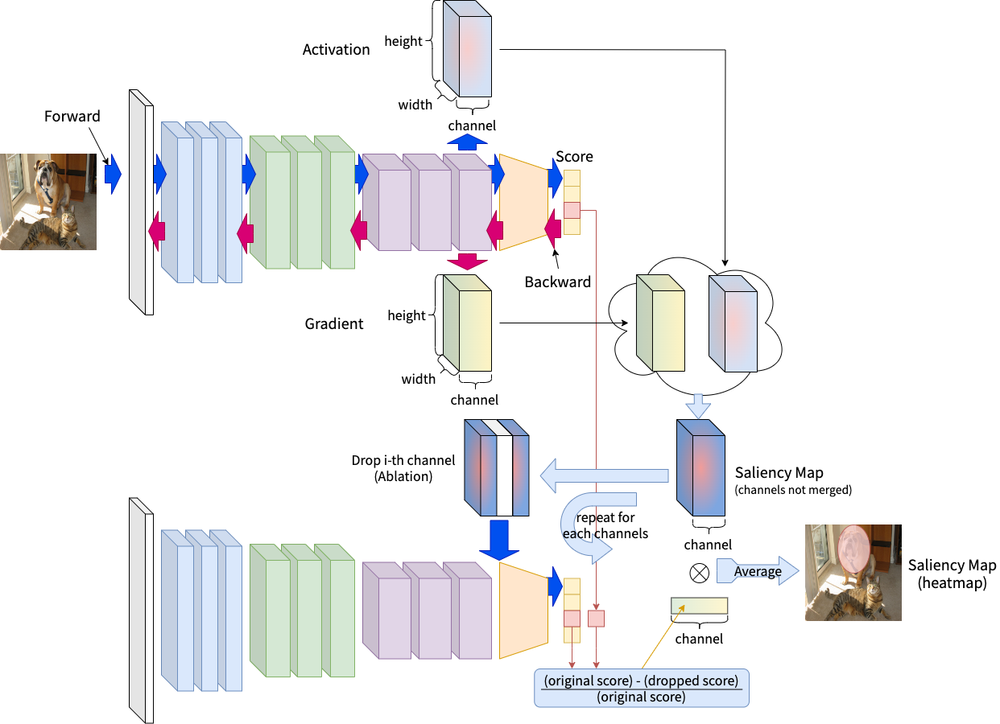

In [80]:
Image.open("ablation.png")

In [81]:
ablationcam: CAM = CAM(cam_model="Ablation-CAM", **init_option)

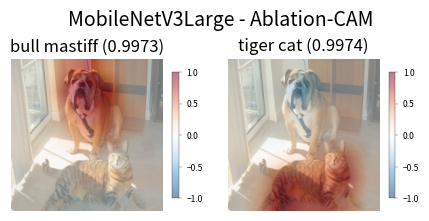

In [82]:
draw_two_heatmaps(
    model=ablationcam,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

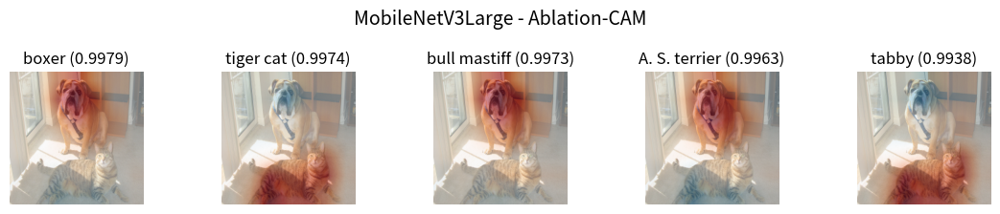

In [83]:
draw_topn_label(
    model=ablationcam,
    target="last",
    option=draw_option,
)

## Score-CAM

* [Score-CAM: Score-Weighted Visual Explanations for Convolutional Neural Networks](https://arxiv.org/abs/1910.01279)
    * H. Wang. et al.
    * CVPR (Conference on Computer Vision and Pattern Recognition) 2020
* 良い点：
    * gradient を使わなくてもそこそこいける
    * ネットワーク構成に全く依存しない
* 悪い点：「非常に重い！」
    * MobileNet V3 Large では、last Conv. Layer における channel 数は 960
    * これを全部やると、非常に多くの時間がかかる
* [kerasでScore-CAM実装．Grad-CAMとの比較](https://qiita.com/futakuchi0117/items/95c518254185ec5ea485)を ~~パクって~~ リスペクトして、分散の大きい `n_channels` 個のチャンネルだけ使う実装を入れた
* マスクを作る所に SIGCAM の要素を入れた
    * [A Novel Visual Interpretability for Deep Neural Networks by Optimizing Activation Maps with Perturbation](https://ojs.aaai.org/index.php/AAAI/article/view/16450) (SIGCAM)
        * Q. Zhang, et al.
        * AAAI (Conference on Artificial Intelligence) 2021
    * 元画像と channel 毎の saliency map の掛け合わせと、元画像に非常に大きな blur をかけたものと saliency map の逆符号を掛け合わせを足す
* Grad-CAM を組み合わせると、もっと良くなる

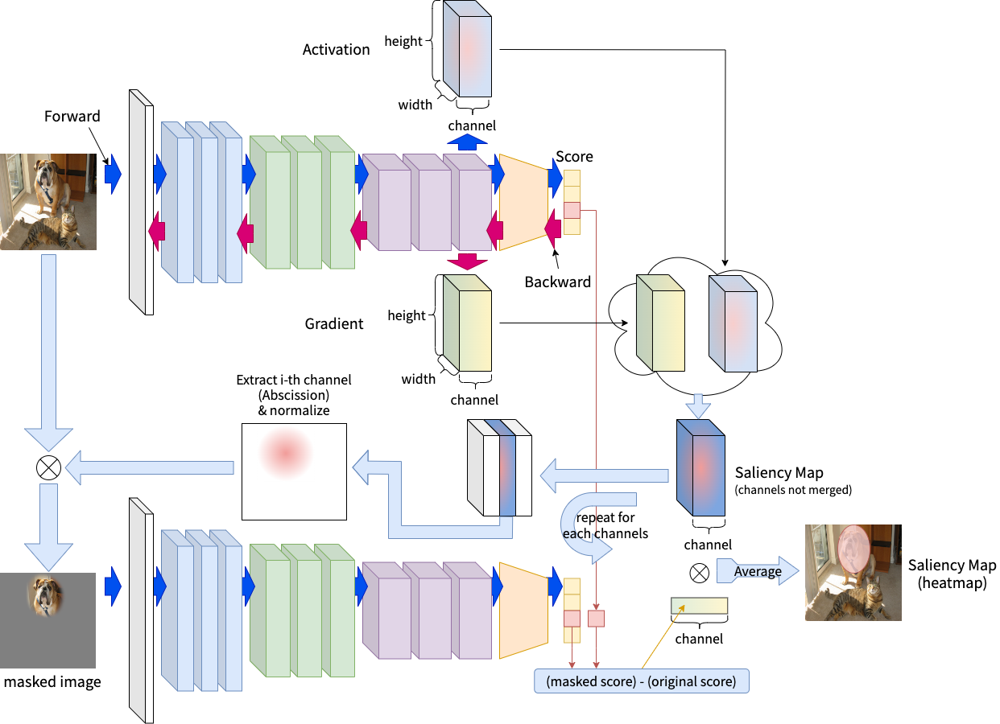

In [84]:
Image.open("abscission.png")

In [85]:
scorecam: CAM = CAM(cam_model="Score-CAM", **init_option)

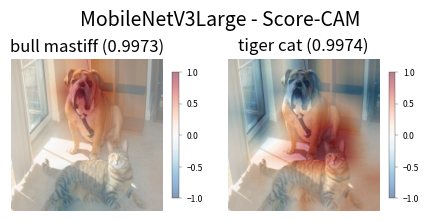

In [86]:
draw_two_heatmaps(
    model=scorecam,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

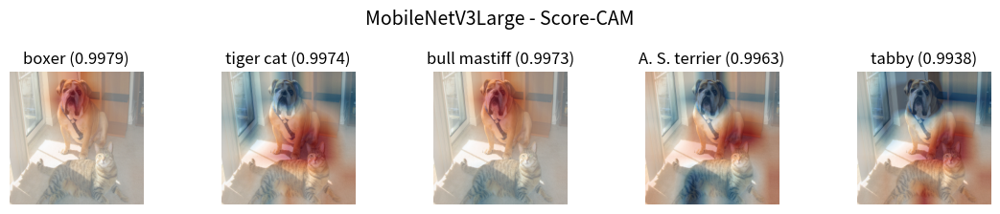

In [87]:
draw_topn_label(
    model=scorecam,
    target="last",
    option=draw_option,
)

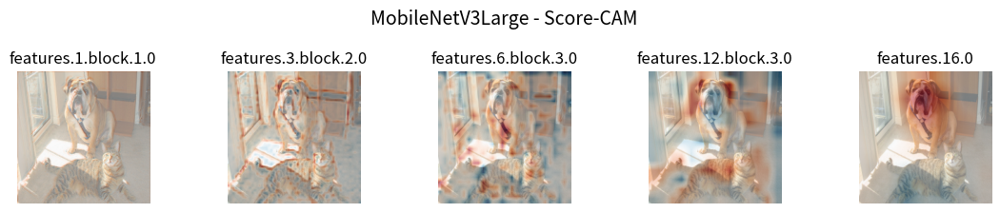

In [88]:
draw_all_convs(
    model=scorecam,
    label=label_dog,
    option=draw_option,
)

# Channel の Clustering を頑張ったモデル

MobileNet V3 Large だと、最終 Conv. Layer の channel 数は 960 もある。これらひとつひとつに対して Ablation や Abscission をやるのは、とてもつらい（Ablation は軽いけど）。

やっていると分かるのだが、channel の中には良い channel、悪い channel があり、さらには似たような channel がいくつもある。

よって、これらをうまい具合に clustering すれば、Ablation であれ Abscission であれ、960 に比べれば格段に少ない回数で Saliency Map を作ることが出来、さらに精度も向上することが期待できる。


* Group-CAM
    * Saliency Map を channel-position 平面に変形し、k-Means で clustering する
* Cluster-CAM
    * Saliency Map を channel-position 平面に変形し、Spectral Clustering で clustering し、一番良いやつと悪いやつだけ使う
* Cosine-CAM（オリジナル）
    * Saliency Map を channel-position 平面に変形し、Normalize してから k-Means で clustering する

## Group-CAM

* [Group-CAM: Group Score-Weighted Visual Explanations for Deep Convolutional Networks](https://arxiv.org/abs/2103.13859)
    * Q. Zhang, et al.
    * arXiv 2021
* 良い点：
    * clustering を導入することによって、例え Abscission しても全然平気
* 悪い点：
    * 本当に k-Means するだけで良いか？

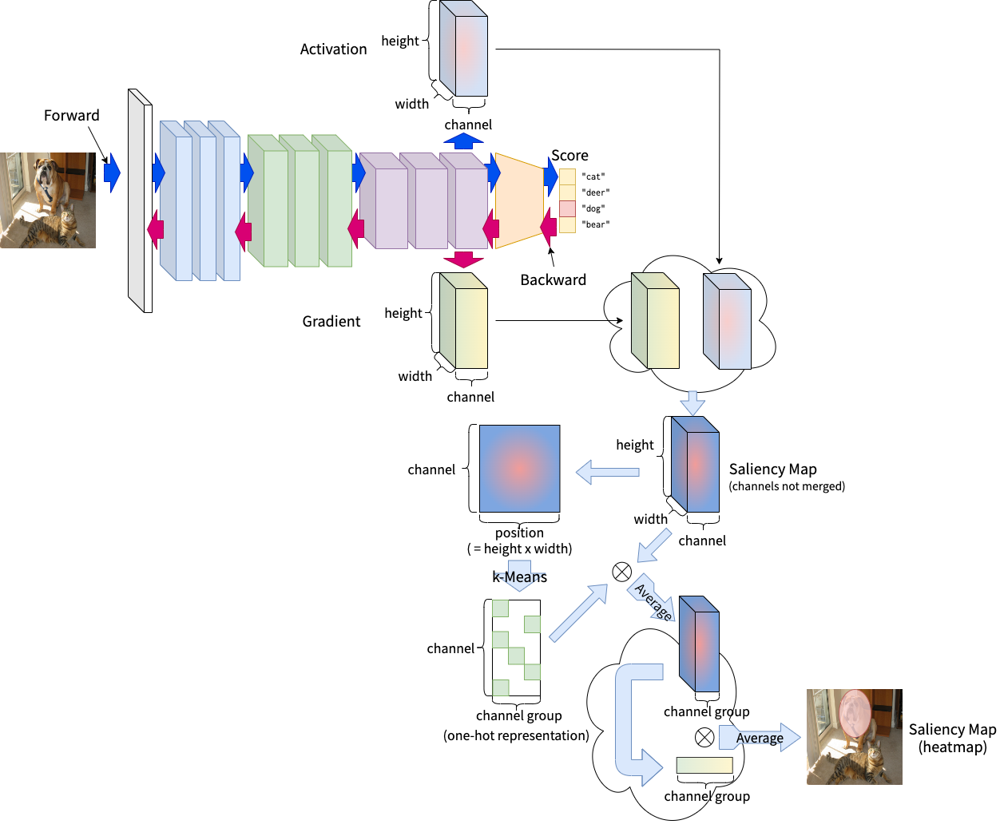

In [89]:
Image.open("groupcam.png")

In [90]:
groupcam: CAM = CAM(
    cam_model="Group-CAM",
    n_groups=n_groups_group,
    **init_option,
)

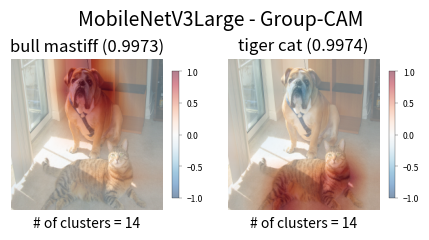

In [91]:
draw_two_heatmaps(
    model=groupcam,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

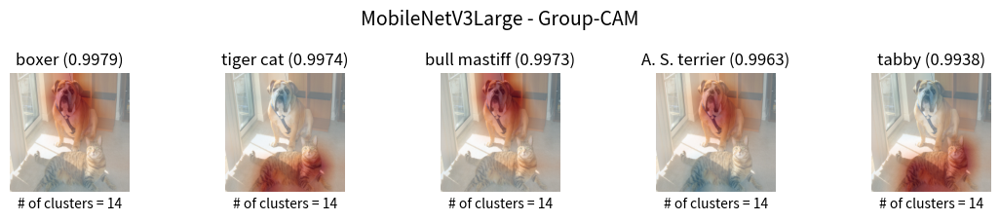

In [92]:
draw_topn_label(
    model=groupcam,
    target="last",
    option=draw_option,
)

## Cluster-CAM

* [Cluster-CAM: Cluster-Weighted Visual Interpretation of CNNs’ Decision in Image Classification](https://arxiv.org/abs/2302.01642)
    * Z. Feng, et al.
    * arXiv 2023
* Group-CAM でのクラスタリングには、spectral clustering もできるよね
* 良いグループを使い、悪いグループを引く
* こういうことをしているので、そもそも複数の対象物がある画像には根本的に向かない

In [93]:
clustercam: CAM = CAM(
    cam_model="Cluster-CAM",
    n_groups=n_groups_group,
    **init_option,
)

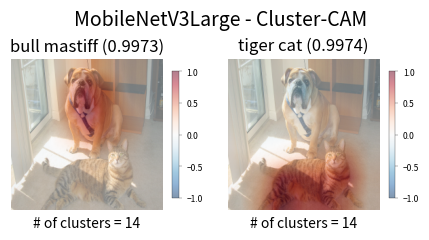

In [94]:
draw_two_heatmaps(
    model=clustercam,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

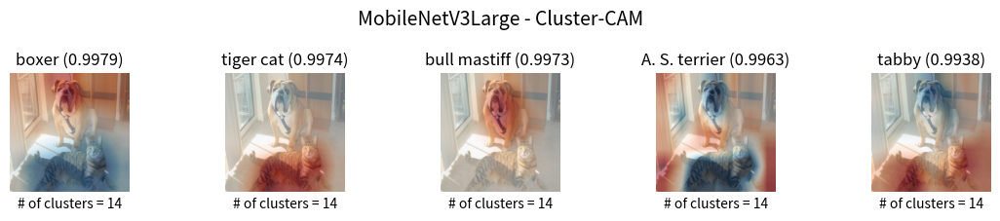

In [95]:
draw_topn_label(
    model=clustercam,
    target="last",
    option=draw_option,
)

## Cosine-CAM

* Group-CAM は channel-position matrix を k-Means するが、ユークリッド距離で k-Means するのは、あまり良くない気がする
    * channel 毎の分布に依存してしまう
* position の状況で clustering するなら、cosine 距離で clustering したい
* Cluster-CAM の実装でも諦めたのだが、cosine 距離で clustering するのはとても難しい
    * あらかじめ cosine 距離で類似度行列（ラプラス行列）を作って Spectral Clustering すれば、理論上は cosine 距離で clustering できる
    * しかし Spectral Clustering は連結グラフであることが前提
    * cosine 距離でラプラス行列を作ると、その保証は全く出来ない
* なので、擬似的な cosine 距離として、各要素の L2-Norm を 1 になるよう normalize してから、k-Means する
    * 一般的に k-Means は Standarize が必須だが、（原因はまだ突き止められていないが）Standarize すると Saliency Map が異常な振る舞いを示す
    * SVD で分解した Channel space を使おうと思ったが、上手くいかなかった
    * なので、単純に Normalize するだけに留める
* Group-CAM よりも少ないクラスタ数で Saliency Map が作れる、気がする

In [96]:
cosinecam: CAM = CAM(
    cam_model="Cosine-CAM",
    n_groups=n_groups_cosine,
    **init_option,
)

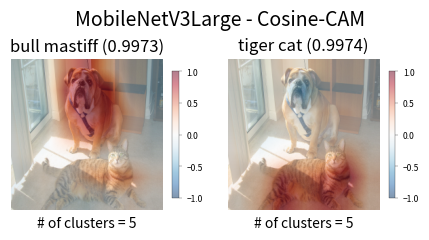

In [97]:
draw_two_heatmaps(
    model=cosinecam,
    target="last",
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

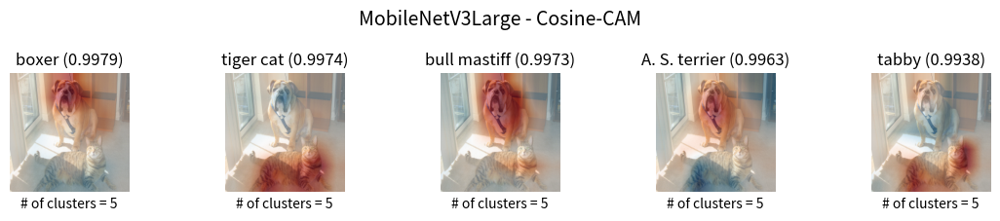

In [98]:
draw_topn_label(
    model=cosinecam,
    target="last",
    option=draw_option,
)

# レイヤ間の Merge を頑張ったモデル

* 複数の layer を使うモデルは、Zoom-CAM, Layer-CAM といくつかあるが、どれを実装しても上手くいかない
* とりあえず両者の良い所どりをして作ってはみた
* しかし、Poly-CAM はコンセプトから違い、これは上手くいく

## 複数のレイヤを統合する

In [99]:
multigradcam: CAM = CAM(cam_model="Grad-CAM", **init_option)
multigradcam.set_cam_name(cam_name="Grad-CAM (ALL-Layer)")

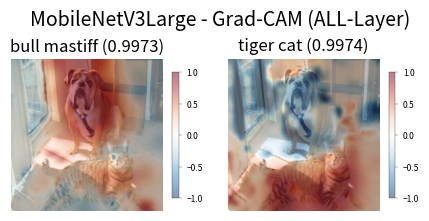

In [100]:
draw_two_heatmaps(
    model=multigradcam,
    target=target_all,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

## Poly-CAM

* [Poly-CAM: High resolution class activation map for convolutional neural networks](https://arxiv.org/abs/2204.13359)
    * A. Englebert, et al.
    * ICPR (International Conference on Pattern Recognition) 2022
* 一番下位（最後に近い）Activation, Gradient で普通に Saliency Map を作る
* 上位の Activation を、局所的に normalize, upsampling することによって、より高解像度化する mask とする

In [101]:
polycam: CAM = CAM(cam_model="Poly-CAM", **init_option)

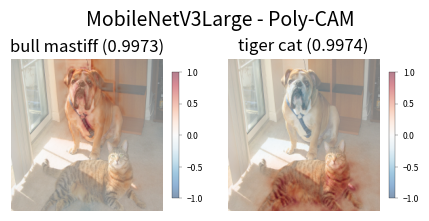

In [102]:
draw_two_heatmaps(
    model=polycam,
    target=target_all,
    left=label_dog,
    right=label_cat,
    option=draw_option,
)

# All Explanations at once

In [103]:
draw_all_option: Dict[str, Any] = {
    "nrows": 5,
    "ncols": 4,
}

In [104]:
def draw_original(path: str, title: str, ax: mpl.axes.Axes) -> None:
    ax.imshow(Image.open(path))
    ax.set_title(title)
    ax.set_axis_off()
    return

In [105]:
all_models: List[Dict] = [
    {"model": lime, "target": "last"},
    {"model": dummycam, "target": target_last},
    {"model": fakecam, "target": target_last},
    {"model": vanillacam, "target": "last"},
    {"model": gradcam, "target": target_last},
    {"model": gradcampp, "target": target_last},
    {"model": smoothgradcampp, "target": target_last},
    {"model": integradcam, "target": target_last},
    {"model": xgradcam, "target": target_last},
    {"model": hirescam, "target": target_last},
    {"model": eigencam, "target": target_last},
    {"model": eigengradcam, "target": target_last},
    {"model": ablationcam, "target": "last"},
    {"model": scorecam, "target": "last"},
    {"model": groupcam, "target": "last"},
    {"model": clustercam, "target": "last"},
    {"model": cosinecam, "target": "last"},
    {"model": multigradcam, "target": target_all},
    {"model": polycam, "target": target_all},
]

In [106]:
def draw_all_explanations(
    label: int,
    nrows: int,
    ncols: int,
    all_models: List[Dict],
    option: DrawOption,
) -> None:
    figsize: float = option["figsize"]
    rc: Dict[str, Any] = option["rc"]
    path: str = option["path"]
    if len(all_models) + 1 > (nrows * ncols):
        raise ValueError("nrows and ncols are too few")
    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols, figsize=(figsize * ncols, figsize * nrows)
    )
    with plt.rc_context(rc=rc):
        draw_original(
            path=path,
            title="Original",
            ax=axes[0][0],
        )
        for i, model in enumerate(all_models):
            u: int = (i + 1) // ncols
            v: int = (i + 1) % ncols
            _ = model["model"].draw(
                target=model["target"],
                label=label,
                ax=axes[u][v],
                title_model=True,
                **option,
            )
        title: str = (
            "Discriminative Image Regions of "
            f'"{all_models[0]["model"].cam.labels[label]}"'
            f' ({all_models[0]["model"].cnn_model})'
        )
        fig.suptitle(title)
        plt.tight_layout()
        plt.show()
        plt.clf()
        plt.close()
    return

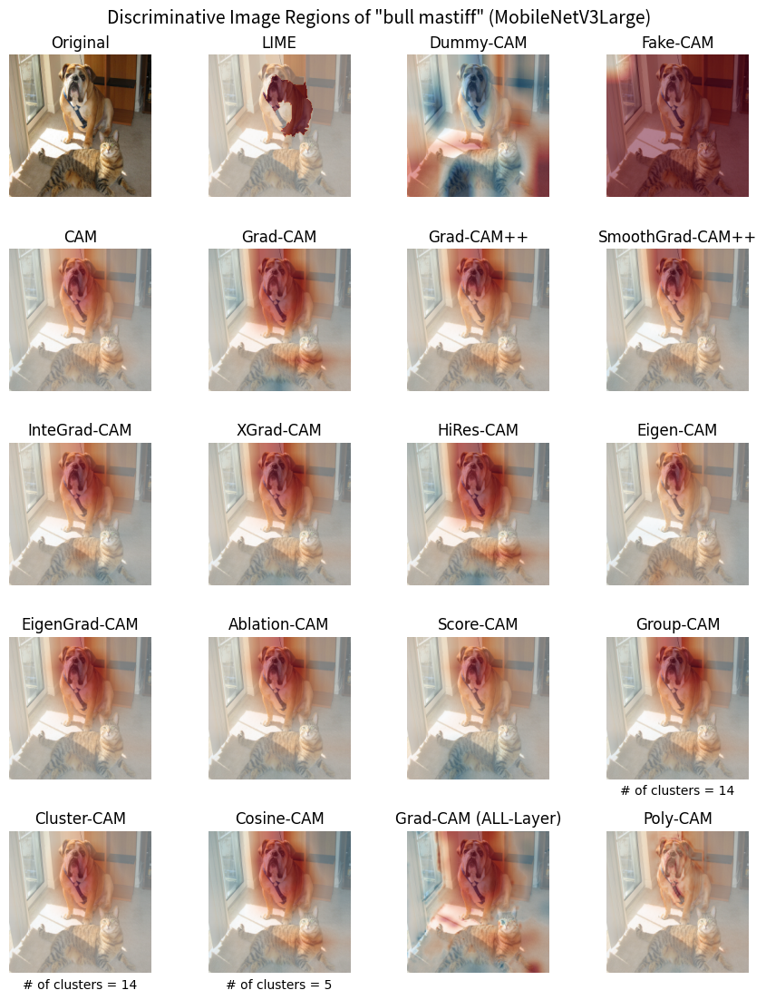

In [107]:
draw_all_explanations(
    label=label_dog,
    all_models=all_models,
    option=draw_option,
    **draw_all_option,
)

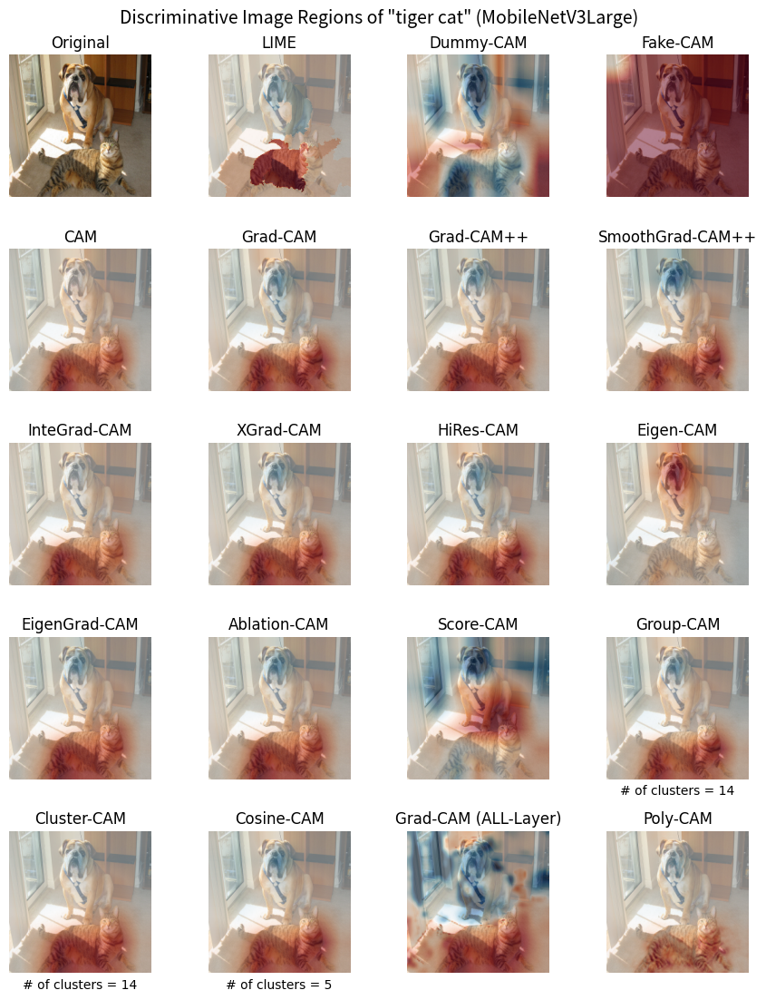

In [108]:
draw_all_explanations(
    label=label_cat,
    all_models=all_models,
    option=draw_option,
    **draw_all_option,
)

# 実装しなかった CAM たち

## RISE

* [RISE: Randomized Input Sampling for Explanation of Black-box Models](https://arxiv.org/abs/1806.07421)
    * V. Petsiuk, et al.
    * BMVC (British Machine Vision Conference) 2018
* いっぱいマスクを作り、スコアの weighted mean

## IS-CAM

* [IS-CAM: Integrated Score-CAM for axiomatic-based explanations](https://arxiv.org/abs/2010.03023)
    * R. Naidu, et al.
    * arXiv 2020
* ScoreCAM に IntegratedGradの考え方を入れる
    * [Axiomatic Attribution for Deep Networks](https://arxiv.org/abs/1703.01365)
* CICスコア取る時に使うと絶望的に計算量が多くなってめんどくさいので、最初の Grad, Activation取るときだけ入れる

## SS-CAM

* [SS-CAM: Smoothed Score-CAM for Sharper Visual Feature Localization](https://arxiv.org/abs/2006.14255)
    * H. Wang, et al.
    * arXiv 2020
* Score-CAM やるときに SmoothGrad 使う
    * CIC スコア取る時に使うと絶望的に計算量が多くなってめんどくさいので、最初のGrad, Activation取る時だけ入れる

## Zoom-CAM

* [Zoom-CAM: Generating Fine-grained Pixel Annotations from Image Labels](https://arxiv.org/abs/2010.08644)
    * X. Shi, et al.
    * ICPR (International Conference on Pattern Recognition) 2020
* Layer-CAM とほぼ同じ？

## Layer-CAM

* [LayerCAM: Exploring Hierarchical Class Activation Maps for Localization](https://mmcheng.net/mftp/Papers/21TIP_LayerCAM.pdf)
    * P. Jiang, et al.
    * IEEE Transactions on Image Processing, Volume 30, 2021
* 複数の Conv. Layer の Grad-CAM をとって足す

## LFI-CAM

* [LFI-CAM: Learning Feature Importance for Better Visual Explanation](https://arxiv.org/abs/2105.00937)
    * K. Lee, et al.
    * ICCV (International Conference on Computer Vision) 2021
* 一般的なモデルに Feature Importance を学習する Attension Branch を組み込み、Attention MAP (≒ CAM）を作成し、それを Attention のように Feature Map（activations）と掛け合わせてスコアを算出する

## LIFT-CAM

* [Towards Better Explanations of Class Activation Mapping](https://arxiv.org/abs/2102.05228)
    * H. Jung, et al.
    * ICCV (Internatilnal Conference on Computer Vision) 2021
* [Captum](https://captum.ai/) という Package に収録されている DeepLIFT というアルゴリズムを使っている
    * [Learning Important Features Through Propagating Activation Differences](https://arxiv.org/abs/1704.02685)
* Captum には LIME や SHAP も含まれている

## Relevance-CAM

* [Relevance-CAM: Your Model Already Knows Where to Look](https://openaccess.thecvf.com/content/CVPR2021/html/Lee_Relevance-CAM_Your_Model_Already_Knows_Where_To_Look_CVPR_2021_paper.html)
    * J. Lee, et al.
    * CVPR (Conference on Computer Vision and Pattern Recognition) 2021
* 各 nn.Module に wrapper を用意して、Layer-wise Relevance Propagation を出来るように仕込んである
    * [Explaining NonLinear Classification Decisions with Deep Taylor Decomposition](https://arxiv.org/abs/1512.02479)

## Abs-CAM

* [Abs-CAM: A Gradient Optimization Interpretable Approach for Explanation of Convolutional Neural Networks](https://arxiv.org/abs/2207.03648)
    * C. Zeng, et al.
    * arXiv 2022
* Score-CAM で、mask として gradient の abs の Global Average
* 実装したいという気持ちが湧かなかったので、黙殺する

## FD-CAM

* [FD-CAM: Improving Faithfulness and Discriminability of Visual Explanation for CNNs](https://arxiv.org/abs/2206.08792)
    * H. Li, et al.
    * ICPR (Internatilnal Conference on Pattern Recognition) 2022
* activation の channel 毎に cosine similarity で on/off の group にわけてスコアを算出し、そのスコアと gradient で weight を作り activation から saliency map を作る
* 作者の実装はあるが、論文の通りに自分で作ろうと思ったら、かなりめんどくさいので、やめる

## Recipro-CAM

* [Recipro-CAM: Fast gradient-free visual explanations for convolutional neural networks](https://arxiv.org/abs/2209.14074)
    * S. Byun, et al.
    * arXiv 2022
* 空間方向の Score-CAM
* 空間方向はとても難しい・・・実装を断念
    * なんとなく出来るし、これが出来るのならば channel で使える方法が全部 position でも適用できる
    * でも、結果が逆転したり、ぐちゃぐちゃなデータになることもある
    * そもそも CNN は１ピクセルだけ見ているわけではなく、Conv なので比較的大きな形で見ている
    * フィルタをよほど上手く作らないとだめなんじゃないか

## Opti-CAM

* [Opti-CAM: Optimizing saliency maps for interpretability](https://arxiv.org/abs/2301.07002)
    * H. Zhang, et al.
    * arXiv 2023
* Score-CAM と同じだが、latent vector を定義して、良い latent を学習して決める